In [1]:
import pandas as pd
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scanpy as sc
import scanpy.external as sce
import matplotlib 
from matplotlib import rcParams
import matplotlib.font_manager
import matplotlib.font_manager as fm
import anndata
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import math
from scipy import ndimage
from scipy.spatial import distance_matrix
from matplotlib_venn import venn3, venn3_circles, venn2
import requests
sc.settings.verbosity = 3

In [63]:
adata=sc.read('/home/data/hli/ImagingMS/feature_enzyme.h5ad')
adata

AnnData object with n_obs × n_vars = 408218 × 588
    obs: 'n_genes_by_counts', 'total_counts', 'n_counts', 'n_genes', 'renal_region', 'patient_id', 'sample_id', 'leiden', 'leiden1', 'leiden2', 'leiden3', 'leiden_use', 'leiden4', 'sample_id_new', 'patient_id_new', 'renal_region_new', 'glom_list'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std', 'mz_raw', 'new_index', 'mol_formula', 'adduct', 'moleculeNames', 'moleculeIds', 'genes', 'common_name', 'class_name', 'subclass_name', 'class_name_short', 'subclass_name_short', 'genes_all'
    uns: 'dendrogram_leiden_use', 'dendrogram_patient_id_new', 'dendrogram_renal_region', 'dendrogram_renal_region_new', 'dendrogram_sample_id_new', 'glom_list_colors', 'leiden', 'leiden1_colors', 'leiden2_colors', 'leiden3_colors', 'leiden4_colors', 'leiden_colors', 'leiden_use_colors', 'neighbors', 'patient_id_colors', 'patient_id_new_colors', 'pca', 'rank_genes_groups_glom', 'rank_genes_groups_leiden_use',

In [64]:
marker_genes=[]
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['1'][0])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['1'][1])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['2'][0])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['3'][0])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['4'][0])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['4'][5])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['5'][0])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['5'][6])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['6'][11])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['6'][6])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['7'][0])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['7'][2])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['8'][0])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['9'][3])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['10'][0])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['10'][1])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['11'][0])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['11'][2])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['12'][0])
marker_genes.append(adata.uns['rank_genes_groups_leiden_use']['names']['12'][2])

In [65]:
marker_genes_formula=[]
for i in marker_genes:
    idx=list(adata.var['mz_raw']).index(i)
    marker_genes_formula.append(adata.var.index[idx])

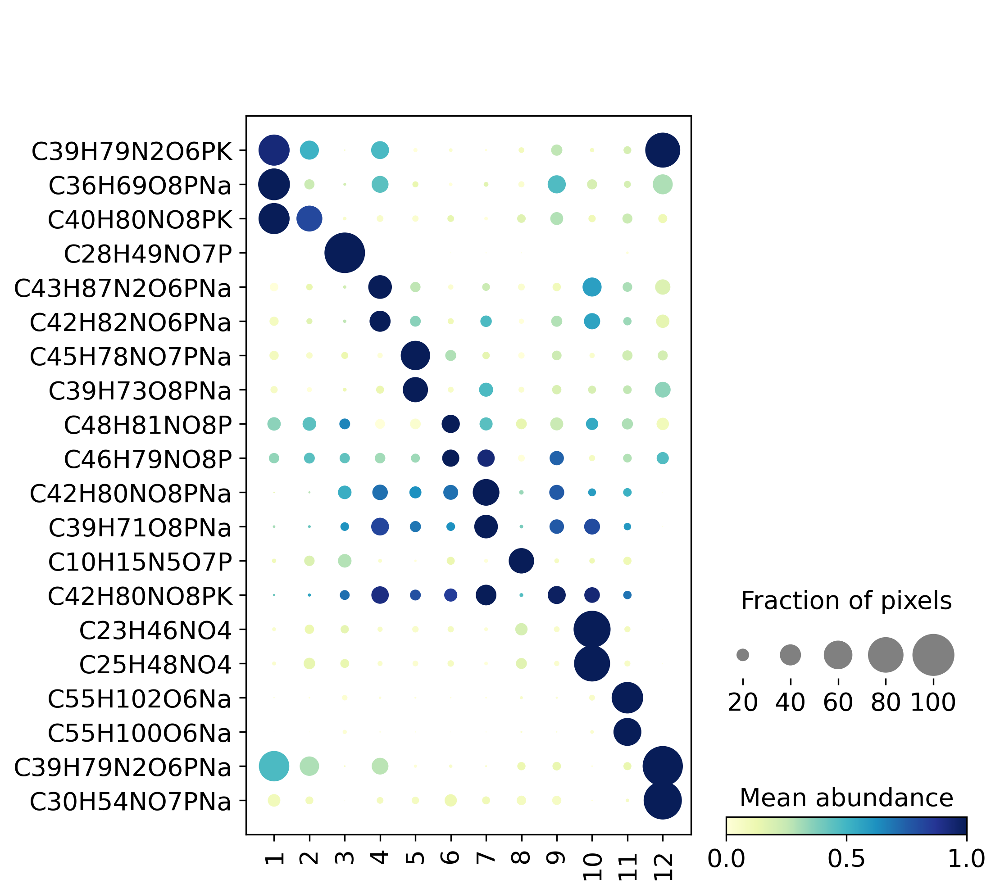

In [66]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=16)

sc.pl.DotPlot(adata, marker_genes_formula, groupby='leiden_use',
             standard_scale='var',expression_cutoff=0.8
             )\
.style(cmap="YlGnBu",largest_dot=500,dot_edge_lw=0,size_exponent=1.5)\
.legend(width=2.4,colorbar_title='Mean abundance',size_title='Fraction of pixels\n').swap_axes().show()

In [67]:
common_name_formula=[]
for i in range(len(adata.var.index)):
    if '),' in adata.var['common_name'][i]:
        name1=adata.var['common_name'][i].split('),')[0]
        common_name_formula.append(str(name1)+') | '+str(adata.var.index[i]))
    else:
        name1=adata.var['common_name'][i].split(',')[0]
        common_name_formula.append(str(name1)+' | '+str(adata.var.index[i]))

In [68]:
adata.var.index=common_name_formula

In [69]:
marker_genes_formula_new=[]
for i in marker_genes:
    idx=list(adata.var['mz_raw']).index(i)
    marker_genes_formula_new.append(adata.var.index[idx])

In [71]:
list(adata.var['mz_raw']).index(adata.uns['rank_genes_groups_leiden_use']['names']['3'][0])

551

In [72]:
adata.var.common_name[551]

'LysoPC(20:5(5Z,8Z,11Z,14Z,17Z)/0:0)'

In [73]:
common_name_formula[551]=adata.var.common_name[551]+' | '+str(adata.var.mol_formula[551])

In [74]:
list(adata.var['mz_raw']).index(adata.uns['rank_genes_groups_leiden_use']['names']['12'][2])

134

In [75]:
adata.var.common_name[134]

'LysoPC(22:4(7Z,10Z,13Z,16Z)/0:0)'

In [76]:
common_name_formula[134]=adata.var.common_name[134]+' | '+str(adata.var.mol_formula[134])
adata.var.index=common_name_formula

In [77]:
marker_genes_formula_new=[]
for i in marker_genes:
    idx=list(adata.var['mz_raw']).index(i)
    marker_genes_formula_new.append(adata.var.index[idx])

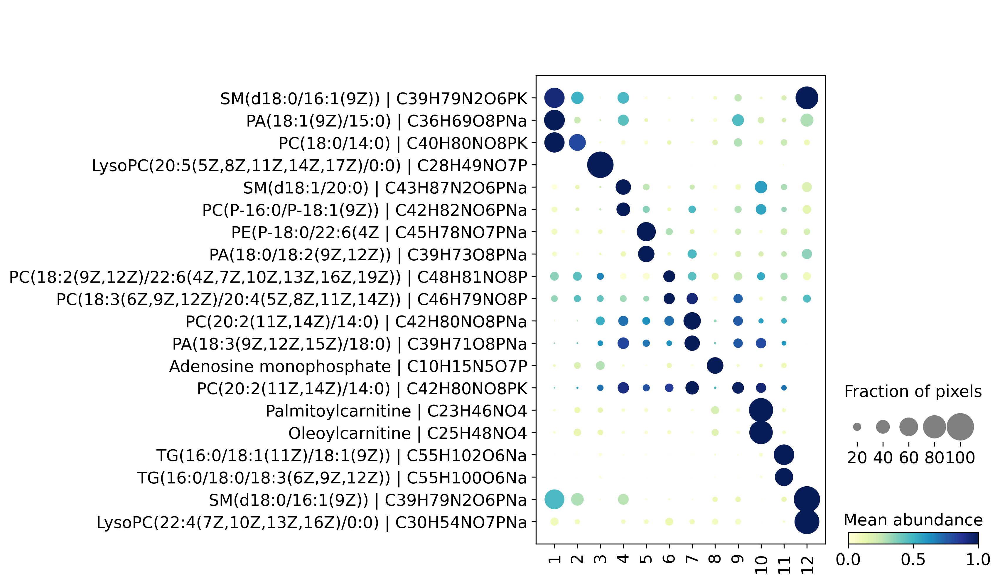

In [78]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=16)

sc.pl.DotPlot(adata, marker_genes_formula_new, groupby='leiden_use',
             standard_scale='var',expression_cutoff=0.8
             )\
.style(cmap="YlGnBu",largest_dot=500,dot_edge_lw=0,size_exponent=1.5)\
.legend(width=2,colorbar_title='Mean abundance',size_title='Fraction of pixels\n').swap_axes().show()

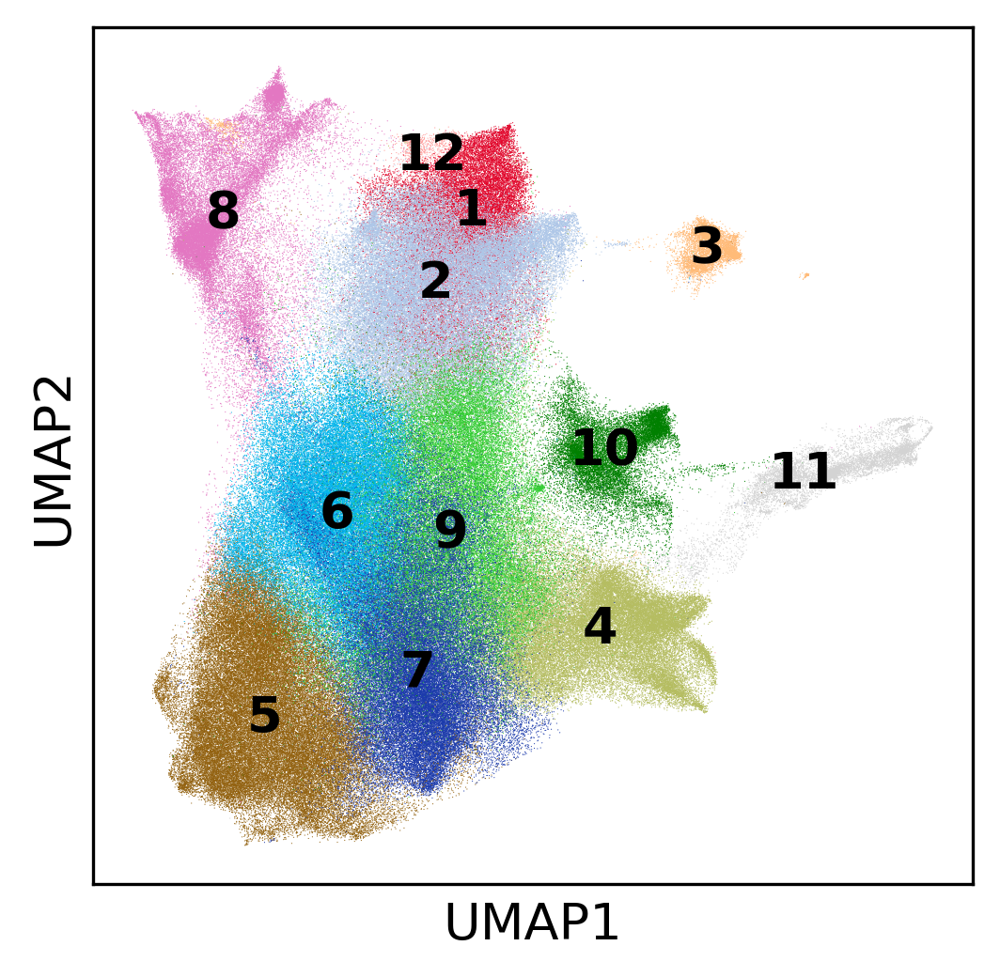

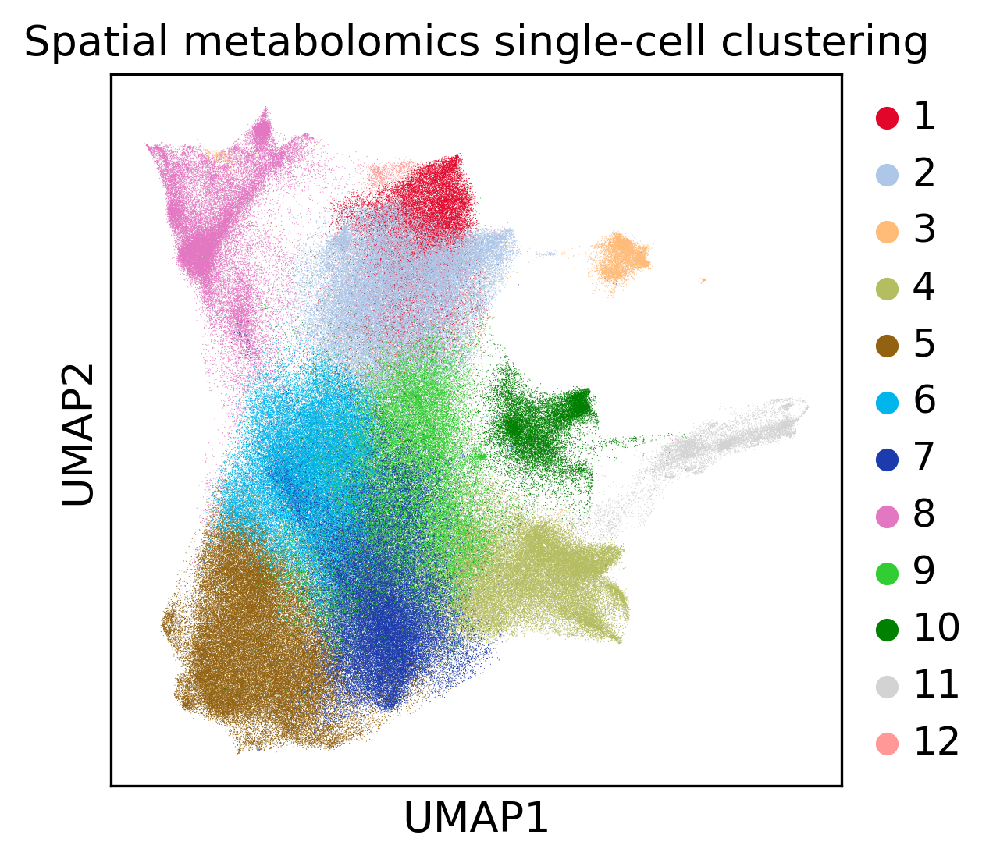

In [84]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=13)
sc.pl.umap(adata, color=['leiden_use'],legend_loc='on data', title='')
sc.pl.umap(adata, color=['leiden_use'], title='Spatial metabolomics single-cell clustering')

In [ ]:
##in the below analysis, we should import MALDIpy functions accordingly

In [87]:
cortex_pt2 = pd.read_csv('23-0179-haikuo_li-flex-patient2-cortex_pixel_intensities_tic_normalized.csv',sep=',',skiprows=2)
medulla_pt2 = pd.read_csv('23-0179-haikuo_li-flex-patient2-medulla_pixel_intensities_tic_normalized.csv',sep=',',skiprows=2)
papilla_pt2 = pd.read_csv('23-0179-haikuo_li-flex-patient2-papilla_pixel_intensities_tic_normalized.csv',sep=',',skiprows=2)
cortex_pt3 = pd.read_csv('23-0179-haikuo_li-flex-patient3-cortex_pixel_intensities_tic_normalized.csv',sep=',',skiprows=2)
medulla_pt3 = pd.read_csv('23-0179-haikuo_li-flex-pt3-medulla_pixel_intensities_tic_normalized.csv',sep=',',skiprows=2)
papilla_pt3 = pd.read_csv('23-0179-haikuo_li-flex-pt3-papilla_pixel_intensities_tic_normalized.csv',sep=',',skiprows=2)

cortex_pt2_obj = msi_data(cortex_pt2,scale=10)
medulla_pt2_obj = msi_data(medulla_pt2,scale=10)
papilla_pt2_obj = msi_data(papilla_pt2,scale=10)
cortex_pt3_obj = msi_data(cortex_pt3,scale=10)
medulla_pt3_obj = msi_data(medulla_pt3,scale=10)
papilla_pt3_obj = msi_data(papilla_pt3,scale=10)

count_cortex_pt2 = np.mean(adata[adata.obs['sample_id'] == 'cortex_pt2', :].obs['total_counts'])
count_medulla_pt2 = np.mean(adata[adata.obs['sample_id'] == 'medulla_pt2', :].obs['total_counts'])
count_papilla_pt2 = np.mean(adata[adata.obs['sample_id'] == 'papilla_pt2', :].obs['total_counts'])

count_cortex_pt3 = np.mean(adata[adata.obs['sample_id'] == 'cortex_pt3', :].obs['total_counts'])
count_medulla_pt3 = np.mean(adata[adata.obs['sample_id'] == 'medulla_pt3', :].obs['total_counts'])
count_papilla_pt3 = np.mean(adata[adata.obs['sample_id'] == 'papilla_pt3', :].obs['total_counts'])
print(count_cortex_pt2,count_medulla_pt2,count_papilla_pt2,count_cortex_pt3,count_medulla_pt3,count_papilla_pt3)

count_total=np.mean([count_cortex_pt2,count_medulla_pt2,count_papilla_pt2,count_cortex_pt3,count_medulla_pt3,count_papilla_pt3])
print(count_total)

305006.4 633883.3 652327.75 676082.06 1154802.5 1130999.9
758850.3


Feature mz: 741.530654593237


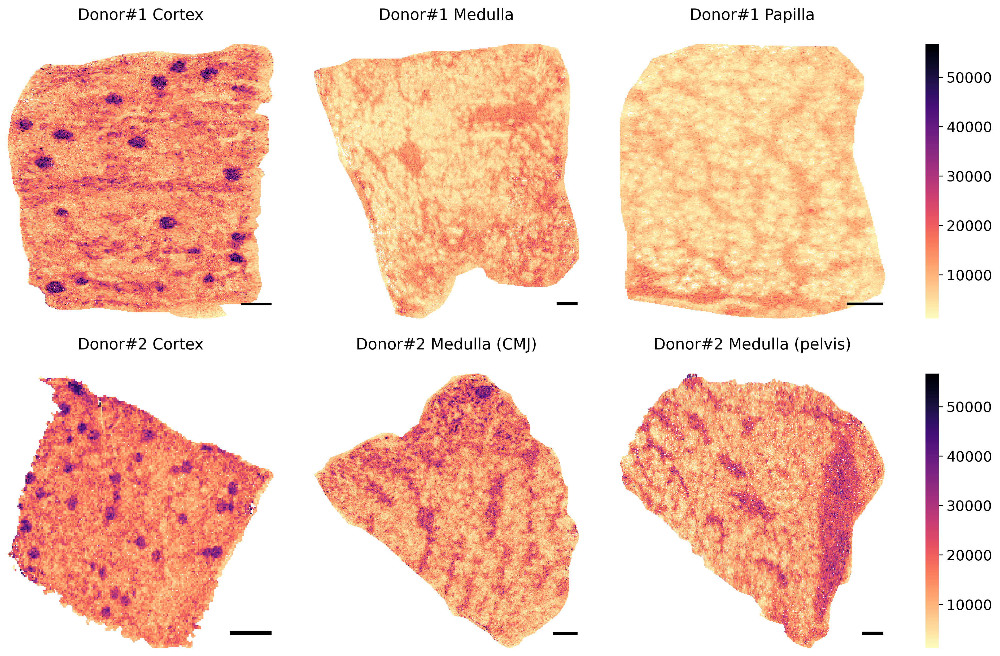

In [93]:
import matplotlib.colors as mcolors
cmap_1 = mcolors.LinearSegmentedColormap.from_list('name1',["black", "lime"], N=256)
cmap_2 = mcolors.LinearSegmentedColormap.from_list('name2',["black", "magenta"], N=256) 
plot_tissues2_norm_mz(
    mz_use=float(adata.uns['rank_genes_groups_leiden_use']['names']['1'][0]),
    cmap = 'magma_r')

In [94]:
mz_use=adata.uns['rank_genes_groups_leiden_use']['names']['1'][0]
idx=list(adata.var.mz_raw).index(mz_use)
adata.var.iloc[idx]

n_cells_by_counts                                                   396633
mean_counts                                                    8479.358398
pct_dropout_by_counts                                            32.248824
total_counts                                                  4964036608.0
mean                                                                   0.0
std                                                             6368.49938
mz_raw                                                    741.530654593237
new_index                                                        741.53065
mol_formula                                                   C39H79N2O6PK
adduct                                                                  +K
moleculeNames                            SM(d18:0/16:1(9Z)),SM(d18:1/16:0)
moleculeIds                                        HMDB0013464,HMDB0010169
genes                    PIGP,CD1D,CD1E,PIGA,PIGC,GM2A,PSAP,SGMS2,PIGZ,...
common_name              

In [95]:
mz_use=adata.uns['rank_genes_groups_leiden_use']['names']['1'][1]
idx=list(adata.var.mz_raw).index(mz_use)
adata.var.iloc[idx]

n_cells_by_counts                                                   163969
mean_counts                                                     785.447083
pct_dropout_by_counts                                            71.991507
total_counts                                                   459821152.0
mean                                                                  -0.0
std                                                            1669.229679
mz_raw                                                    683.462148253237
new_index                                                        683.46215
mol_formula                                                    C36H69O8PNa
adduct                                                                 +Na
moleculeNames                                            PA(18:1(9Z)/15:0)
moleculeIds                                                    HMDB0114923
genes                                                      PLD2,DDHD1,CDS2
common_name              

Feature mz: 683.462148253237


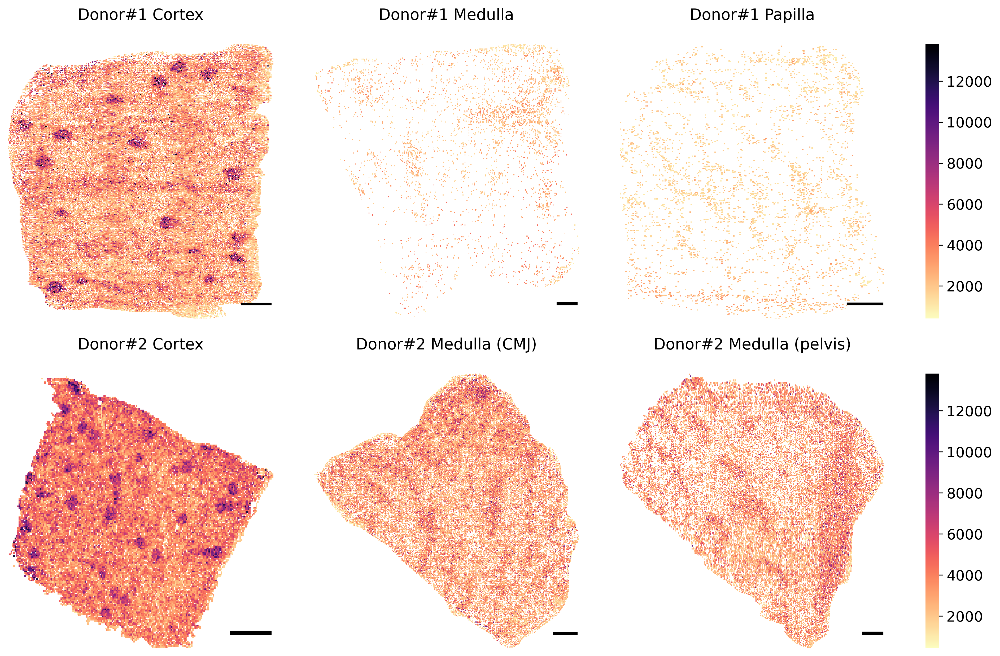

Feature mz: 683.462148253237


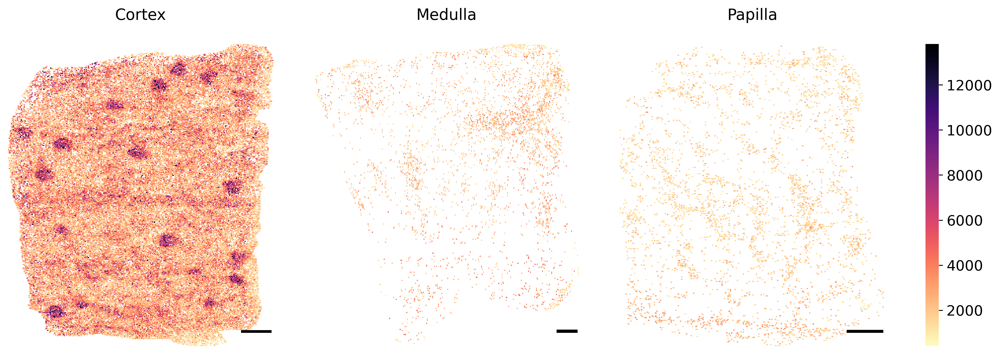

In [99]:
plot_tissues2_norm_mz(
    mz_use=float(adata.uns['rank_genes_groups_leiden_use']['names']['1'][1]),
    cmap = 'magma_r')
plot_tissues_norm_mz(
    mz_use=float(adata.uns['rank_genes_groups_leiden_use']['names']['1'][1]),
    cmap = 'magma_r')

In [104]:
mz_use=adata.uns['rank_genes_groups_leiden_use']['names']['12'][2]
idx=list(adata.var.mz_raw).index(mz_use)
adata.var.iloc[idx]

n_cells_by_counts                                                    76109
mean_counts                                                     285.229065
pct_dropout_by_counts                                            86.999382
total_counts                                                   166980512.0
mean                                                                   0.0
std                                                             1312.27672
mz_raw                                                   594.3529321632369
new_index                                                        594.35293
mol_formula                                                   C30H54NO7PNa
adduct                                                                 +Na
moleculeNames                                 LysoPC(22:4(7Z,10Z,13Z,16Z))
moleculeIds                                                    HMDB0010401
genes                    LPCAT2,LCAT,LPCAT3,LYPLA2,CLC,PLA2G7,PAFAH2,AS...
common_name              

Feature mz: 594.3529321632369


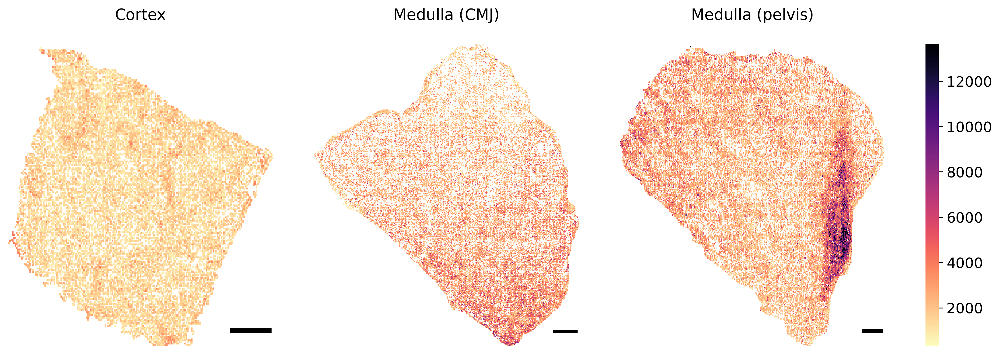

In [103]:
mz_use=adata.uns['rank_genes_groups_leiden_use']['names']['12'][2]
plot_tissues_norm_mz2(
    mz_use=float(mz_use),
    cmap = 'magma_r')

In [107]:
from matplotlib.colors import LinearSegmentedColormap
traffic=LinearSegmentedColormap.from_list('name',["limegreen", "w", "red"], N=256)

In [115]:
idx=list(adata.var.mol_formula).index('C45H78NO7PNa')
print(idx)
adata.var.iloc[idx]

1


n_cells_by_counts                                                   407287
mean_counts                                                   18407.951172
pct_dropout_by_counts                                            30.428953
total_counts                                                 10776493056.0
mean                                                                  -0.0
std                                                            5755.552644
mz_raw                                                   798.5407329312369
new_index                                                        798.54073
mol_formula                                                   C45H78NO7PNa
adduct                                                                 +Na
moleculeNames                       PE(P-18:0/22:6(4Z,7Z,10Z,13Z,16Z,19Z))
moleculeIds                                                    HMDB0011394
genes                                                                 PLD2
common_name              

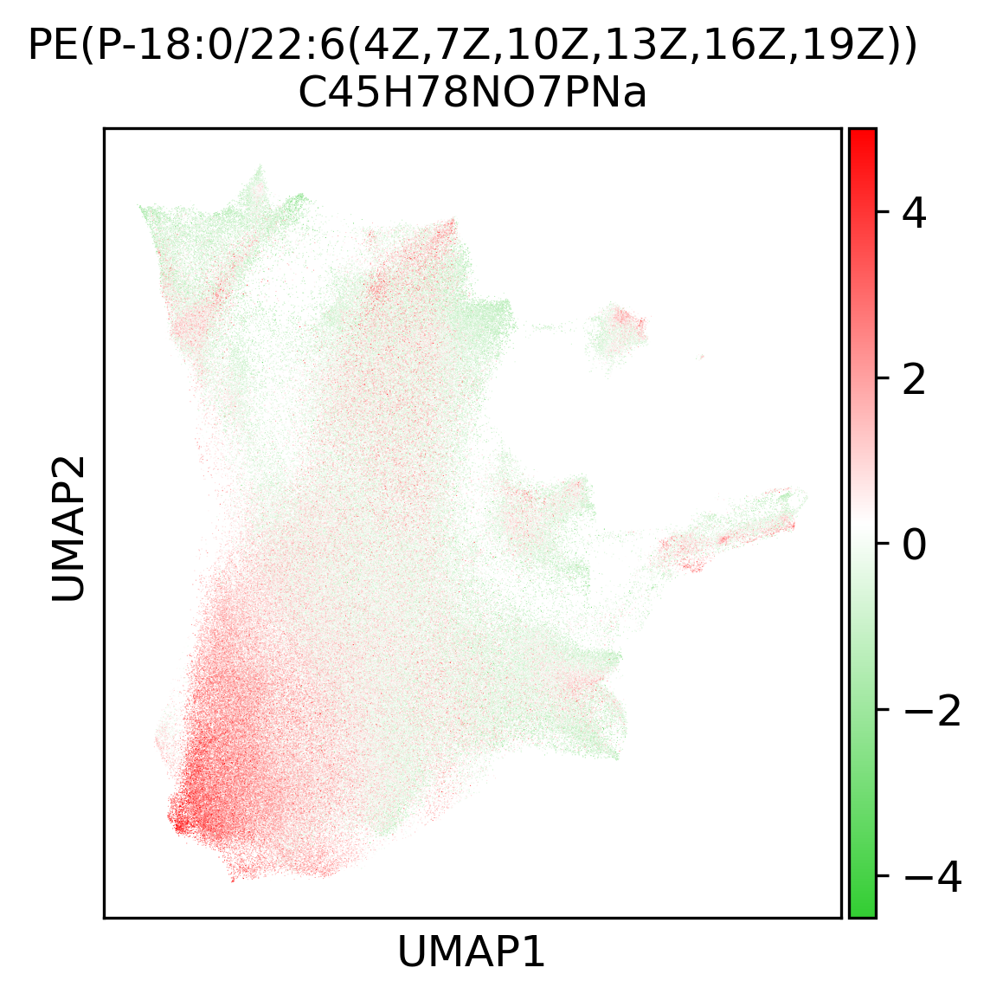

In [118]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=12)
sc.pl.umap(adata, color=adata.var.index[1], cmap=traffic, vmax=5,
          title='PE(P-18:0/22:6(4Z,7Z,10Z,13Z,16Z,19Z))\nC45H78NO7PNa')

In [119]:
idx=list(adata.var.mol_formula).index('C42H80NO8PNa')
print(idx)
adata.var.iloc[idx]

3


n_cells_by_counts                                                   408033
mean_counts                                                        17769.0
pct_dropout_by_counts                                            30.301524
total_counts                                                 10402434048.0
mean                                                             -0.000001
std                                                            7876.578846
mz_raw                                                   780.5512976152369
new_index                                                         780.5513
mol_formula                                                   C42H80NO8PNa
adduct                                                                 +Na
moleculeNames            PC(20:2(11Z,14Z)/14:0),PC(18:1(11Z)/16:1(9Z)),...
moleculeIds              HMDB0008328,HMDB0008068,HMDB0008101,HMDB000800...
genes                      PLD2,SGMS2,LCAT,PCYT1B,LYPLA2,CLC,LYPLA1,PCYT1A
common_name              

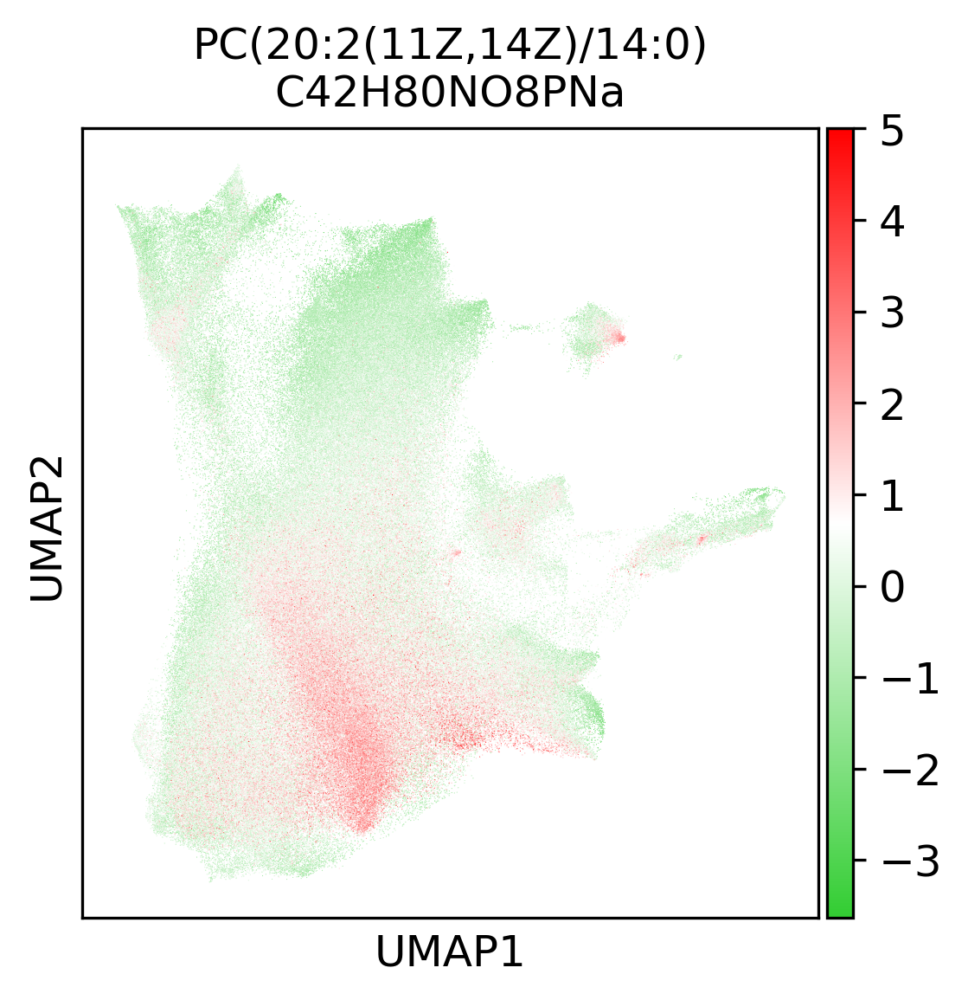

In [121]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=12)
sc.pl.umap(adata, color=adata.var.index[3], cmap=traffic, vmax=5,
          title='PC(20:2(11Z,14Z)/14:0)\nC42H80NO8PNa')